In [1]:
import pandas as pd
import geopandas as gpd
import seaborn as sns

In [2]:
data = gpd.read_file('D:/urbban/berlin_data/berlin_hex2_wgs84.shp')
berlinplan = gpd.read_file('D:/urbban/Planungsraum_EPSG_25833_well.shp',encoding='utf-8')  

In [3]:
data


,ratio_x_am,SUM_hab_x_,id_hex,act_count,diff,actxhab,diff_mean,diff_media,geometry
0,420.372028,420.372028,51,1,173.232028,420.372028,203.372028,360.372028,"POLYGON ((13.11793 52.47251, 13.11996 52.47479..."
1,430.172655,430.172655,54,1,183.032655,430.172655,213.172655,370.172655,"POLYGON ((13.11851 52.45903, 13.12054 52.46131..."
2,23.132252,138.793512,76,6,-224.007748,23.132252,-193.867748,-36.867748,"POLYGON ((13.12191 52.52877, 13.12394 52.53105..."
3,470.449419,470.449419,82,1,223.309419,470.449419,253.449419,410.449419,"POLYGON ((13.12440 52.47036, 13.12643 52.47264..."
4,216.366401,216.366401,88,1,-30.773599,216.366401,-0.633599,156.366401,"POLYGON ((13.12555 52.44341, 13.12757 52.44569..."
...,...,...,...,...,...,...,...,...,...
2972,0.000000,116.248285,4335,0,-247.140000,0.000000,-217.000000,-60.000000,"POLYGON ((13.71817 52.44008, 13.72023 52.44235..."
2973,0.000000,30.194447,4337,0,-247.140000,0.000000,-217.000000,-60.000000,"POLYGON ((13.71843 52.43109, 13.72049 52.43336..."
2974,0.000000,355.700133,4339,0,-247.140000,0.000000,-217.000000,-60.000000,"POLYGON ((13.71869 52.42210, 13.72075 52.42437..."
2975,0.000000,100.247434,4350,0,-247.140000,0.000000,-217.000000,-60.000000,"POLYGON ((13.72486 52.42891, 13.72692 52.43118..."


In [11]:
berlinplan = gpd.GeoDataFrame(berlinplan,geometry='geometry',crs={'init':'epsg:25833'})
berlinplan.rename(columns={"BEZIRK": "District"}, inplace=True)

C:\Users\Alex\anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [18]:
berlinplan

,BEZIRKSREG,District,DESKRIPTOR,KLASSE,KLASSENNAM,SCHLUESSEL,surface,activity,habitants,medina_hab,diff_mean,diff_media,geometry
0,Tiergarten Süd,Mitte,7.0,1.0,PLR_Fläche,01011101,3.667950e+05,18,2457,136.50000,-190.500000,57.500000,"POLYGON ((387256.566 5818552.267, 387323.142 5..."
1,Tiergarten Süd,Mitte,7.0,1.0,PLR_Fläche,01011102,3.009417e+06,26,52,2.00000,-325.000000,192.000000,"POLYGON ((386767.495 5819393.112, 386768.323 5..."
2,Tiergarten Süd,Mitte,7.0,1.0,PLR_Fläche,01011103,5.223551e+05,51,5395,105.78400,-221.216003,88.216003,"POLYGON ((387952.632 5818274.543, 387986.668 5..."
3,Tiergarten Süd,Mitte,7.0,1.0,PLR_Fläche,01011104,3.383434e+05,49,4511,92.06120,-234.938797,101.938797,"POLYGON ((388847.061 5817874.656, 388855.531 5..."
4,Tiergarten Süd,Mitte,7.0,1.0,PLR_Fläche,01011105,9.345502e+05,122,326,2.67213,-324.327881,191.327866,"POLYGON ((388129.510 5819015.126, 388157.136 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,Allende-Viertel,Treptow-Köpenick,7.0,1.0,PLR_Fläche,09041403,1.990517e+06,7,3798,542.57100,215.570984,-348.570984,"POLYGON ((406006.537 5811247.619, 406015.225 5..."
444,Altstadt Kietz,Treptow-Köpenick,7.0,1.0,PLR_Fläche,09041501,7.968446e+05,77,6517,84.63640,-242.363602,109.363602,"POLYGON ((403803.718 5811407.686, 403816.828 5..."
445,Köpenick Süd,Treptow-Köpenick,7.0,1.0,PLR_Fläche,09041301,1.701308e+07,24,9478,394.91700,67.916992,-200.916992,"POLYGON ((406890.394 5806614.540, 406808.934 5..."
446,Allende-Viertel,Treptow-Köpenick,7.0,1.0,PLR_Fläche,09041402,9.380318e+05,5,1464,292.80000,-34.200012,-98.799988,"POLYGON ((405243.408 5811746.776, 405283.861 5..."


In [21]:
berlinplan2 = berlinplan[['District','activity','habitants']]
berlinplan2.corr()

,activity,habitants
activity,1.000000,0.562691
habitants,0.562691,1.000000


In [80]:
berlinplan2.District.unique()

array(['Mitte', 'Friedrichshain-Kreuzberg', 'Pankow',
       'Charlottenburg-Wilmersdorf', 'Spandau', 'Steglitz-Zehlendorf',
       'Tempelhof-Schöneberg', 'Neukölln', 'Treptow-Köpenick',
       'Marzahn-Hellersdorf', 'Lichtenberg', 'Reinickendorf'],
      dtype=object)

In [97]:
datacorr = {}
datacorr['district'] = []
datacorr['values'] = []

for i in berlinplan2['District'].unique():
    df3 = berlinplan2[berlinplan2['District']==i]
    for j in df3.corr().values:
        datacorr['district'].append(i)
        datacorr['values'].append(j)

In [130]:
district2.reset_index(inplace=True)

In [155]:
district2 = pd.DataFrame.from_dict(datacorr)

district2 = district2['values'].apply(lambda x: pd.Series(x[0])).stack().reset_index(level=1, drop=True).to_frame('values').join(district2[['district']], how='right')

district3 = district2[district2['values'] != 1]

In [164]:
district4 = district3.sort_values('values')
district4

,values,district
19,0.110239,Marzahn-Hellersdorf
11,0.319375,Steglitz-Zehlendorf
1,0.352806,Mitte
23,0.414930,Reinickendorf
7,0.476873,Charlottenburg-Wilmersdorf
9,0.574154,Spandau
5,0.683913,Pankow
17,0.703689,Treptow-Köpenick
13,0.715862,Tempelhof-Schöneberg
3,0.742598,Friedrichshain-Kreuzberg


In [167]:
import altair as alt
alt.Chart(district4).mark_bar(filled=True).encode(
  alt.X( 'values:Q',title='Correlation habitants and commercial activity'),
  alt.Y( 'district:N',title='Disrict'), alt.Color('district:N', scale=alt.Scale(scheme='goldgreen')), alt.OpacityValue(0.8)

).properties(
    width=550,height=450
)


alt.Chart(...)

In [55]:
import pingouin as pg
pg.corr(x=berlinplan2['activity'], y=berlinplan2['habitants'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,448,0.562691,"[0.5, 0.62]",0.316621,0.31355,8.998784e-39,3.011e+35,1.0


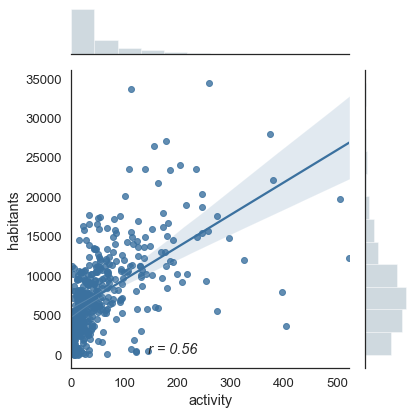

In [169]:
g = sns.JointGrid(data=berlinplan2, x='activity', y='habitants')
g = g.plot_joint(sns.regplot, color="xkcd:muted blue")
g = g.plot_marginals(sns.distplot, kde=False, bins=12, color="xkcd:bluey grey")
g.ax_joint.text(145, 95, 'r = 0.56', fontstyle='italic')
plt.tight_layout()

In [64]:
corr = pg.pairwise_corr(berlinplan2, columns=['Treptow-Köpenick', 'Mitte'], method='spearman')

ValueError: No column combination found. Please make sure that the specified columns exist in the dataframe, are numeric, and contains at least two unique values.

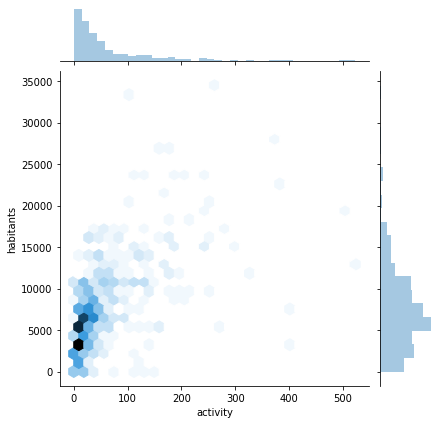

In [5]:
sns.jointplot(x='activity', y='habitants', kind="hex",  data=berlinplan);

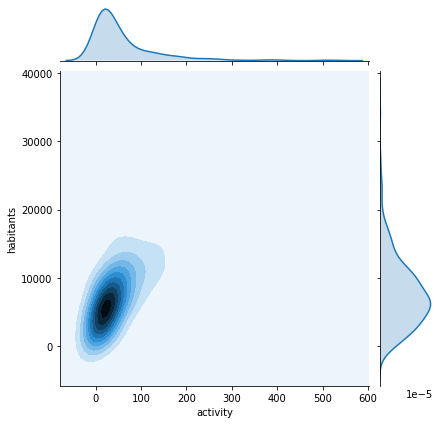

In [6]:
sns.jointplot(x='activity', y='habitants', data=berlinplan, kind="kde");

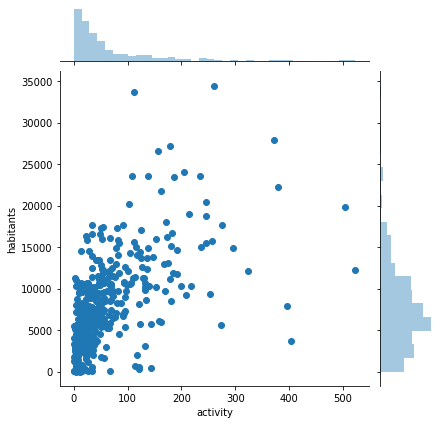

In [7]:

sns.jointplot(x='activity', y='habitants', data=berlinplan)

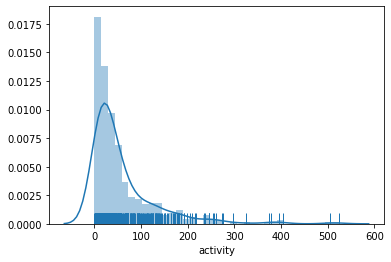

In [8]:
sns.distplot(berlinplan.activity, hist=True, rug=True);

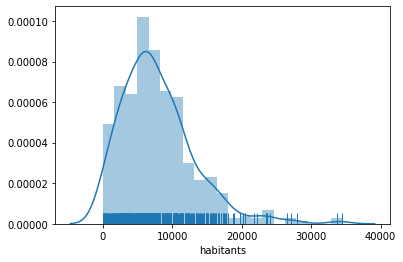

In [9]:
sns.distplot(berlinplan.habitants, hist=True, rug=True);

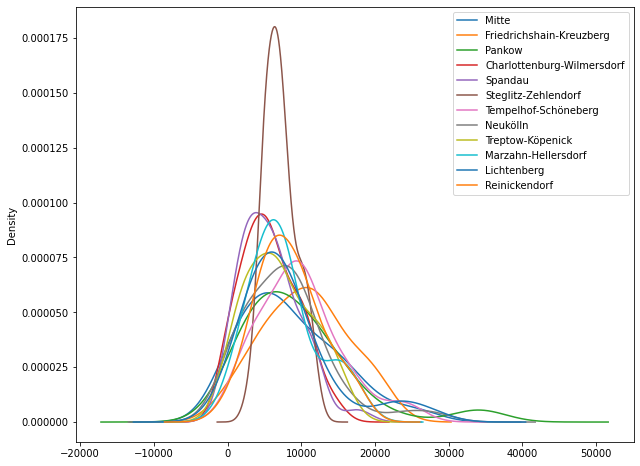

In [10]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,8))
districts = list(berlinplan.District.unique())
for d in districts:
    df2 = berlinplan.loc[berlinplan['District'] == d]
    df2.habitants.plot(kind="kde", ax=ax, label=d)
plt.legend()

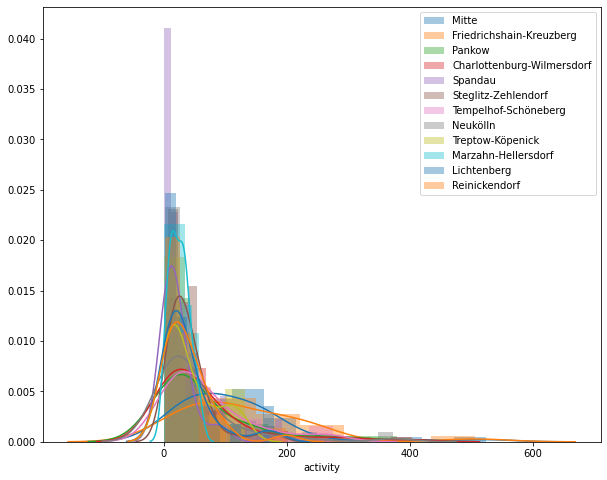

In [11]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,8))
districts = list(berlinplan.District.unique())
for d in districts:
    df2 = berlinplan.loc[berlinplan['District'] == d]
    sns.distplot(df2.activity, hist=True, rug=False, ax=ax, label=d)
plt.legend()

In [12]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(1,100))
berlinplan['activity_scaled'] = scaler.fit_transform(berlinplan[['activity']])
berlinplan['habitants_scaled'] = scaler.fit_transform(berlinplan[['habitants']])

Text(0.5, 0.98, 'KDE population and economic activity in Berlin Districts')

findfont: Font family ['Courier'] not found. Falling back to DejaVu Sans.


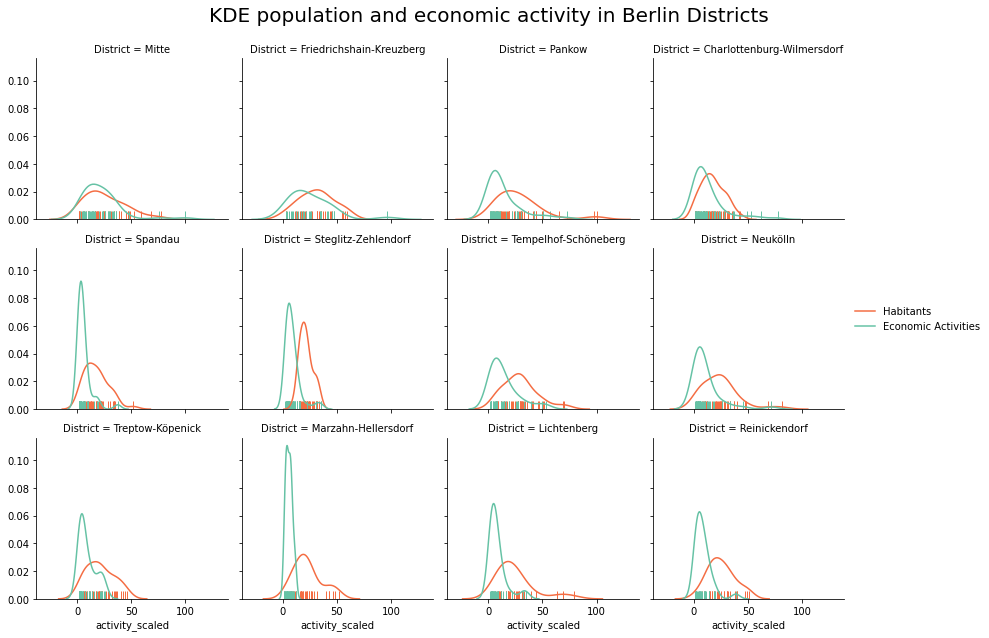

In [13]:
csfont = {'fontname':'Courier', 'size':20}
g = sns.FacetGrid(berlinplan, col="District",
                  height=3, col_wrap=4, aspect=1)
g.map(sns.distplot, "habitants_scaled", hist=False, rug=True,  color="#f46d43", label="Habitants")
g.map(sns.distplot, "activity_scaled", hist=False, rug=True,color="#66c2a5", label="Economic Activities")
g.add_legend();
plt.subplots_adjust(top=0.9)

g.fig.suptitle('KDE population and economic activity in Berlin Districts', **csfont, fontSize=20)

In [14]:
import altair as alt
from vega_datasets import data

scale = alt.Scale(domain=['Mitte', 'Friedrichshain-Kreuzberg', 'Pankow',
       'Charlottenburg-Wilmersdorf', 'Spandau', 'Steglitz-Zehlendorf',
       'Tempelhof-Schöneberg', 'Neukölln', 'Treptow-Köpenick',
       'Marzahn-Hellersdorf', 'Lichtenberg', 'Reinickendorf'],
        range=['#9e0142' ,'#d53e4f',"#95a5a6", "#f46d43", "#fdae61", "#fee08b","#1a1a1a", "#e6f598", "#abdda4", "#66c2a5", "#3288bd",
          '#5e4fa2'])
color = alt.Color('District:N', scale=scale,legend=alt.Legend(title="Districts"))

alt.Chart(
    berlinplan,
    width=220,
    height=180
).transform_density(
    'activity',
    groupby=['District'],
    as_=['Activity', 'density'],
    extent=[1, 400]
    
).mark_area().encode(
    x="Activity:Q",
    y='density:Q',
    color=color,
    opacity = alt.OpacityValue(0.5)
).facet(
    'District:N',
    columns=4
).properties(
    title='KDE of urban economics activites in Berlin Districts').configure_title(
    align="center",fontSize=20,
    font='Courier',
    anchor='start',
    color='black'

)

alt.FacetChart(...)

In [70]:
import altair as alt
from vega_datasets import data

chart1 = alt.Chart(
    berlinplan,    width=220,
    height=180
).transform_density(
    'habitants_scaled',
    groupby=['District'],
    as_=['Habitants', 'Density'],
    extent=[1, 100],
).mark_area().encode(
    x="Habitants:Q",
    y='Density:Q',
    opacity = alt.OpacityValue(0.5)
)


chart2 = alt.Chart(
    berlinplan,    width=220,
    height=180
).transform_density(
    'activity_scaled',
    groupby=['District'],
    as_=['Activity', 'Density'],
    extent=[1, 100],
).mark_area(color='red').encode(
    x="Activity:Q",
    y='Density:Q',opacity = alt.OpacityValue(0.5)
)

(chart1 + chart2).facet(column='District:N', columns=4)

alt.FacetChart(...)

In [103]:
scale = alt.Scale(domain=['Habitants', 'Activity'],
        range=['mediumorchid', 'darkcyan'])
color = alt.Color('District:N', scale=scale,legend=alt.Legend(title="Districts"))


domain = ['Habitants', 'Activity']
range_ = ['#de2d26', '#0570b0']


chart1 = alt.Chart(
    berlinplan,width=220,
    height=180, title="ss"
).transform_density(
    'habitants_scaled',
    groupby=['District'],
    as_=['Habitants', 'Density'],
    extent=[1, 100],
).mark_area().encode(
    x="Habitants:Q",
    y='Density:Q',
    opacity = alt.OpacityValue(0.5),
    color=alt.value('#de2d26')
)




chart2 = alt.Chart(
    berlinplan,width=220,
    height=180, title="see"
).transform_density(
    'activity_scaled',
    groupby=['District'],
    as_=['Activity', 'Density'],
    extent=[1, 100]
).mark_area().encode(
    x="Activity:Q" ,
    y='Density:Q',
    opacity = alt.OpacityValue(0.5),
    color=alt.value('#0570b0'))
 



ost = (chart1 + chart2).facet(
    'District',
    columns=4,bounds='full').properties(
    title='KDE of urban economics activites in Berlin Districts').configure_title(
    align="center",fontSize=20,
    font='Courier',
    anchor='start',
    color='black').configure_legend(
    strokeColor='gray',
    fillColor='#EEEEEE',
    padding=10,
    cornerRadius=10,
    orient='top-right').resolve_scale(color='independent').interactive()



ost

alt.FacetChart(...)

C:\Users\Alex\anaconda3\lib\site-packages\altair\utils\core.py:673: UserWarning: Unrecognized encoding channel 'groupby'
  warnings.warn("Unrecognized encoding channel '{}'".format(encoding))


SchemaValidationError: Invalid specification

        altair.vegalite.v4.schema.core.FacetedEncoding, validating 'additionalProperties'

        Additional properties are not allowed ('groupby' was unexpected)
        

alt.Chart(...)

In [46]:
import altair as alt
from vega_datasets import data



stripplot =  alt.Chart(berlinplan, width=40).mark_circle(size=8).encode(
    x=alt.X(
        'jitter:Q',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y=alt.Y('activity:Q'),
    color=alt.Color('Major_Genre:N', legend=None),
    column=alt.Column(
        'District:N',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

stripplot


alt.Chart(...)

In [44]:
berlinplan.columns

Index(['BEZIRKSREG', 'District', 'DESKRIPTOR', 'KLASSE', 'KLASSENNAM',
       'SCHLUESSEL', 'surface', 'activity', 'habitants', 'medina_hab',
       'diff_mean', 'diff_media', 'geometry', 'activity_scaled',
       'habitants_scaled'],
      dtype='object')

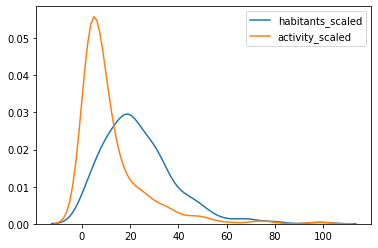

In [18]:
ax = sns.kdeplot(berlinplan['habitants_scaled'])
ax = sns.kdeplot(berlinplan['activity_scaled'])

In [19]:
import numpy as np
berlinplan['activity'].reshape((1,100))

AttributeError: 'Series' object has no attribute 'reshape'